In [2]:
import sys, torch
from src.visualization.netdissect_results import CovidNetDissectResults
from torchvision import models

# Put your model name here
# This is for weighted MSE BrixIA model
model_name = './runs/brixia_weightedmse_3_newmodel/model.pth'
model = models.densenet121(pretrained=False)
model.classifier = torch.nn.Linear(1024, 1, bias=False)
model.load_state_dict(torch.load(model_name,  map_location="cuda:0" if torch.cuda.is_available() else "cpu"))

In [17]:
# Path to annotation dataset
# Download the public covid segmentation dataset from 
# and link a path to it here https://github.com/GeneralBlockchain/covid-19-chest-xray-segmentations-dataset.git
dataset_path = './covid-19-chest-xray-segmentations-dataset'

# Results for last conv layer
We need to set up network disector first. If you want to run other layers before the last one, run the cell below to instantiate the dissector

In [4]:
layername = 'features.denseblock4.denselayer16.conv2'
dissector = CovidNetDissectResults(model, 'covid_seg', dataset_path, layername)

Widget Javascript not detected.  It may not be installed or enabled properly.


**First show some results of the images in covid segmentation dataset and their gt labels. The colour for labels are consistent for other examples (e.g. in further cells, same colours correspond to the same structure)**

,
,No class
,Ground Glass Opacities
,Cardiomediastinum
,Left Lung
,Right Lung
,Airways
,
,No class
,Cardiomediastinum
,Consolidation

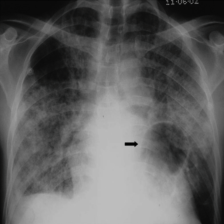
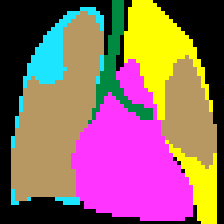
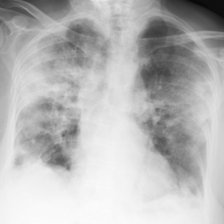
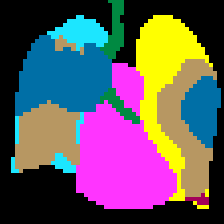

In [5]:
dissector.show_seg_gt(2)

**visualize top activating images, the heatmaps and ground-truth segmentation for first 5 units (change the range in the function args to see other units)**

Widget Javascript not detected.  It may not be installed or enabled properly.



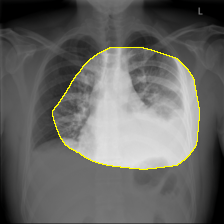
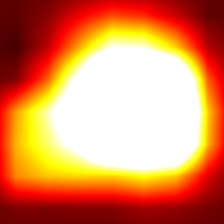
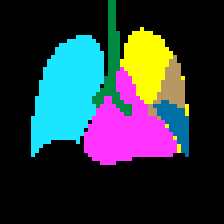
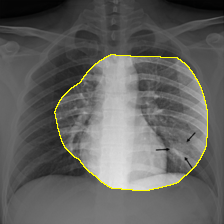
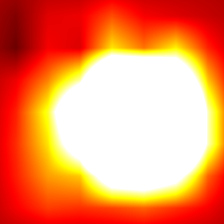
...
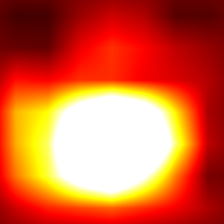
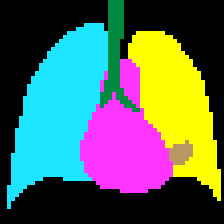
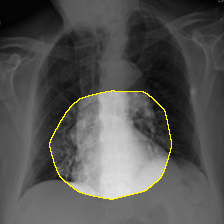
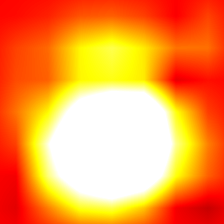
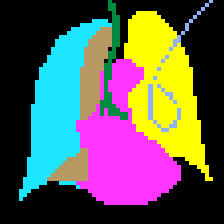

In [6]:
dissector.show_top_activating_imgs_per_units_with_seg(range(5))

**Show top IOU concepts along with top activating images for that unit(which means that thse are not neccessarily the images with that concept bu just the most activating one for the unit)**

Widget Javascript not detected.  It may not be installed or enabled properly.


Widget Javascript not detected.  It may not be installed or enabled properly.



features.denseblock4.denselayer16.conv2



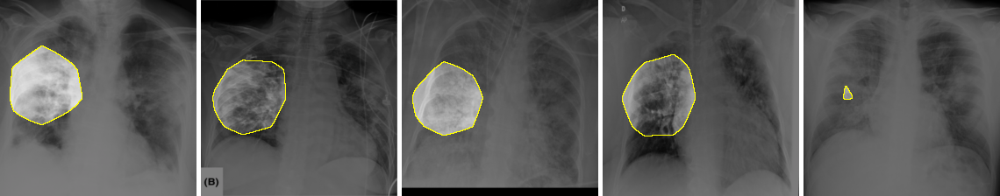


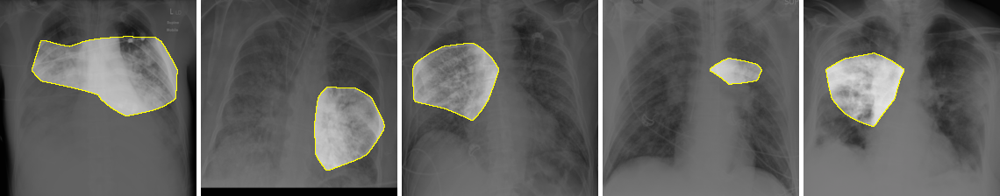


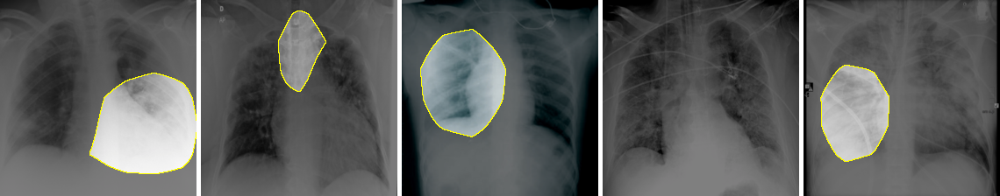


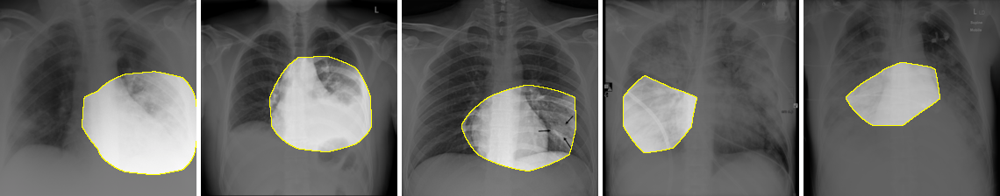


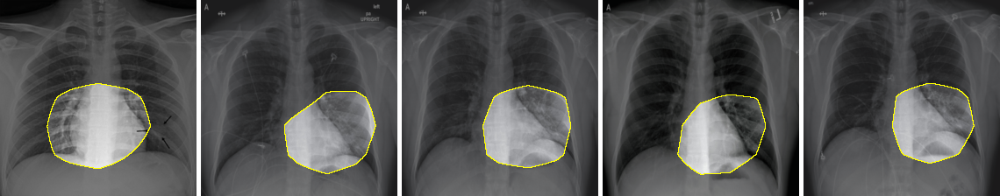


...


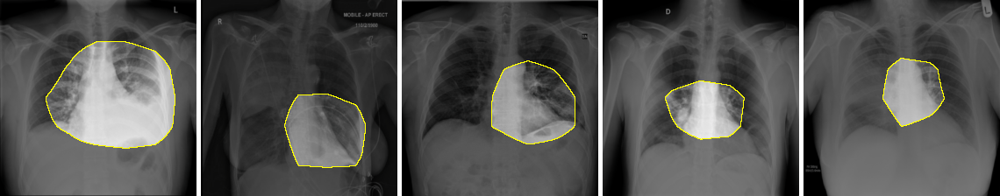


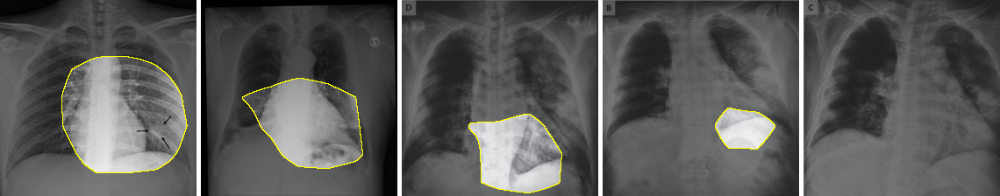


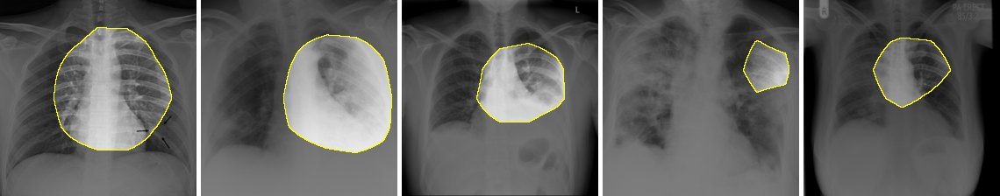


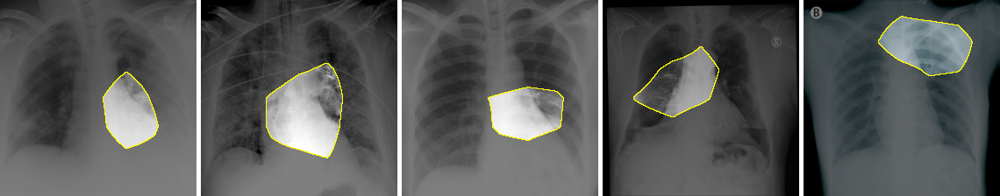


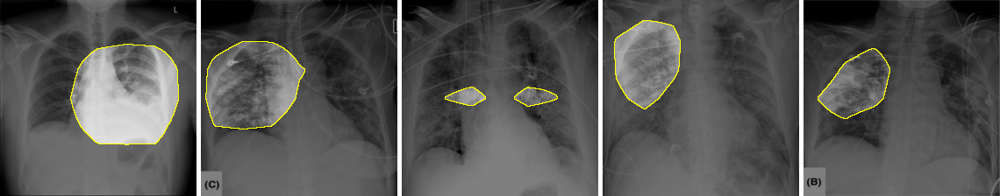

In [7]:
dissector.show_seg_results()

**Build the graph to calculate unique concepts per layer. We need to set up IOU threshold here, as different layers show different range of results, so this is left to be set manually (default from original network dissection method is 0.04 which is insufficient for some layers). Although this particular model is doing pretty good with iou 0.04**

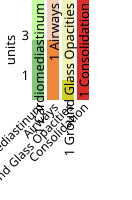

In [8]:
graph = dissector.show_unique_concepts_graph(thresh = 0.04)
import IPython
IPython.display.SVG(graph)

# Results for n-1 conv layer

Widget Javascript not detected.  It may not be installed or enabled properly.


Widget Javascript not detected.  It may not be installed or enabled properly.



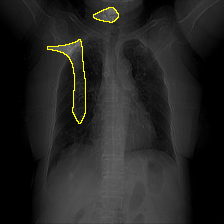
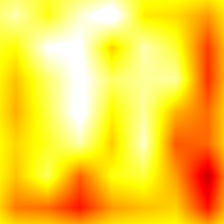
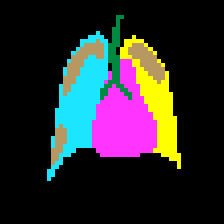
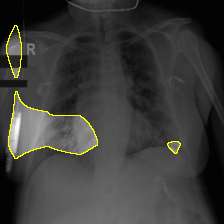
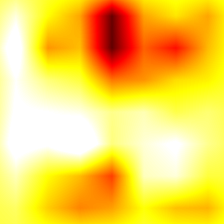
...
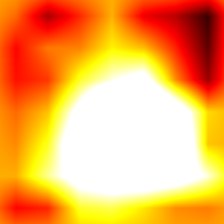
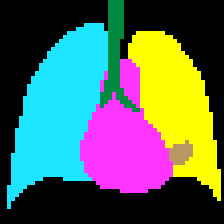
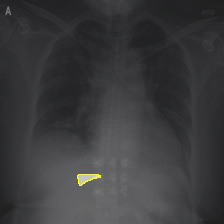
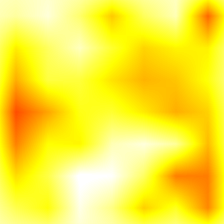
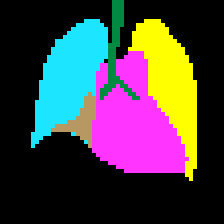

In [10]:
dissector.change_the_retained_layer('features.denseblock4.denselayer16.conv1')
dissector.show_top_activating_imgs_per_units_with_seg(range(5))

Widget Javascript not detected.  It may not be installed or enabled properly.


Widget Javascript not detected.  It may not be installed or enabled properly.



features.denseblock4.denselayer16.conv1



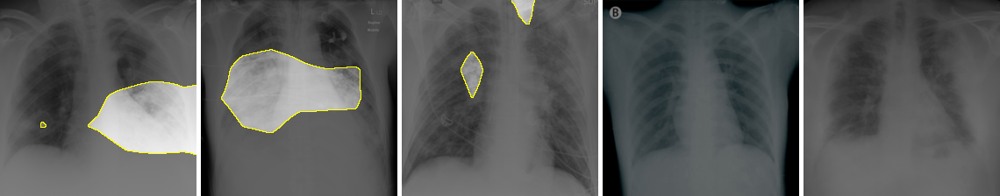


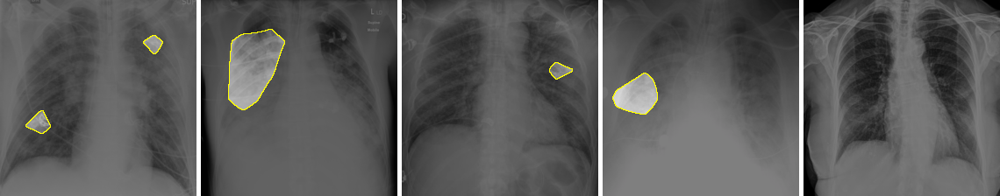


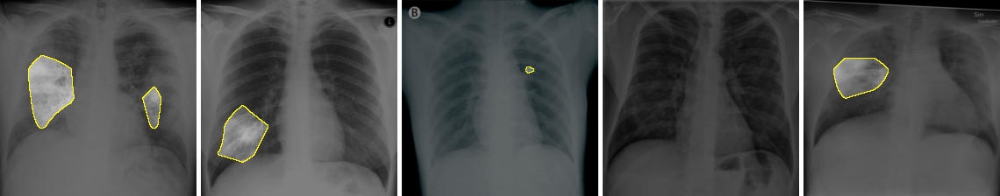


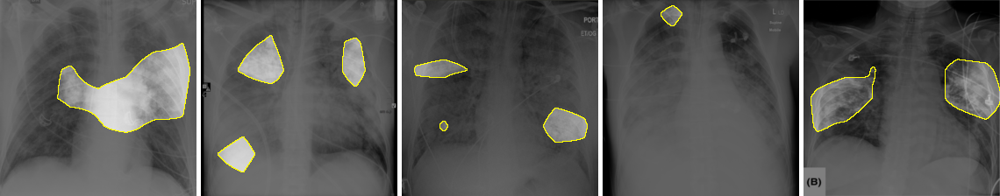


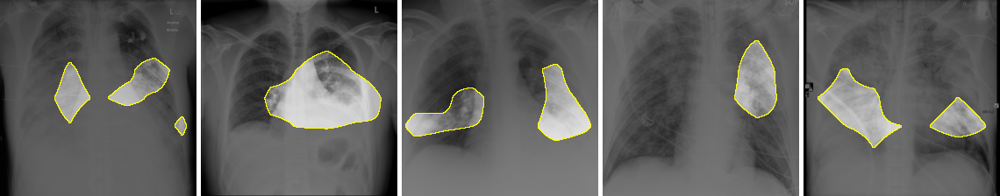


...


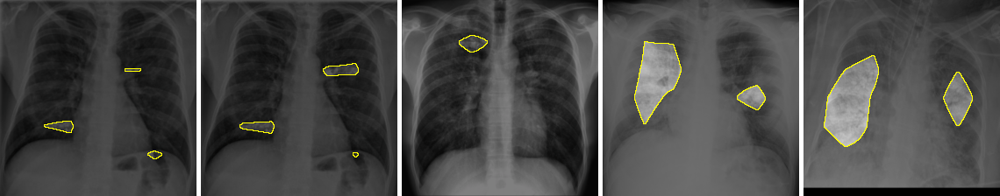


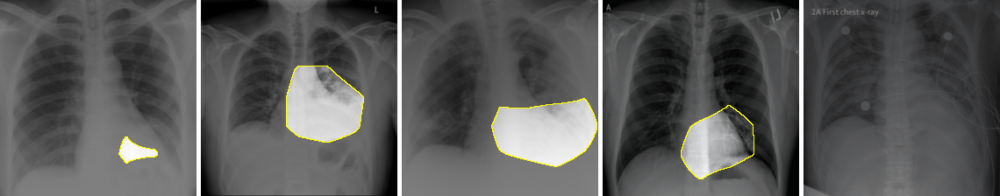


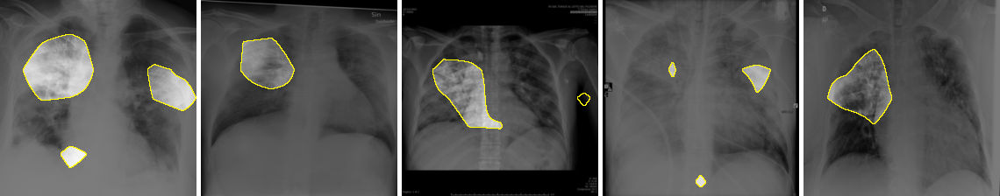


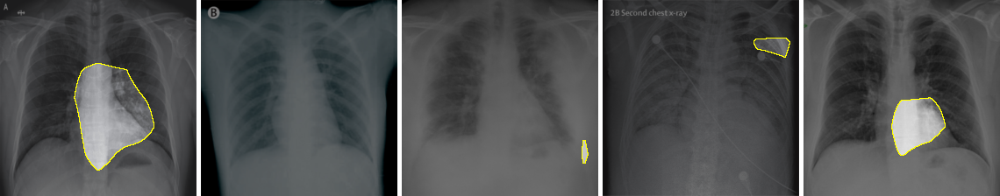


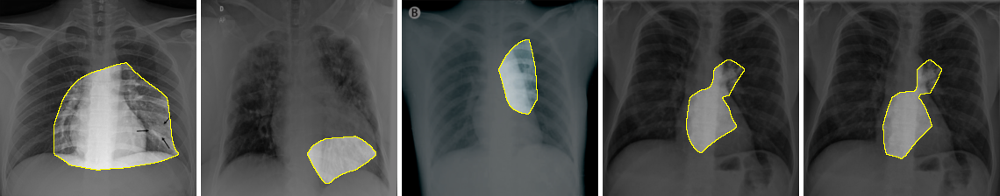

In [11]:
dissector.show_seg_results()

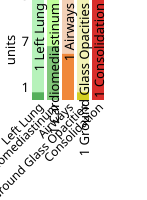

In [12]:
graph = dissector.show_unique_concepts_graph(thresh = 0.05)
import IPython
IPython.display.SVG(graph)

# Results for n-2 conv layer
**NOTE:** deeper layers do not make sense at all and are activated all over the image

Widget Javascript not detected.  It may not be installed or enabled properly.


Widget Javascript not detected.  It may not be installed or enabled properly.



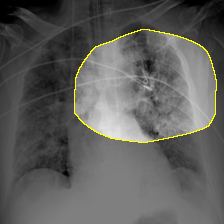
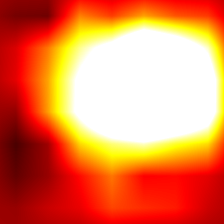
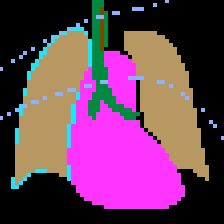
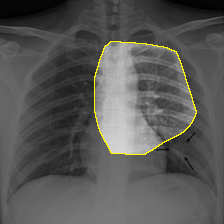
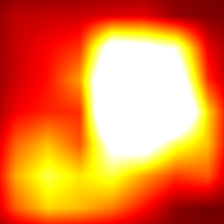
...
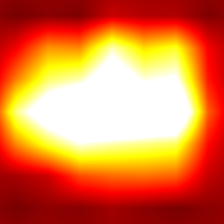
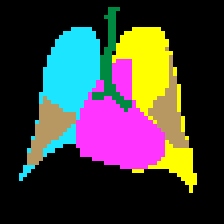
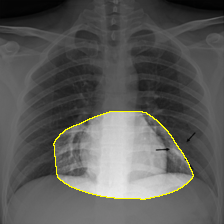
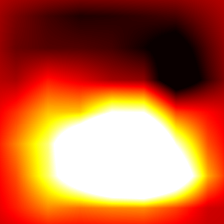
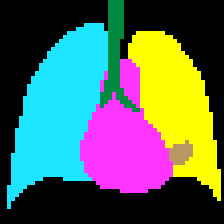

In [13]:
dissector.change_the_retained_layer('features.denseblock4.denselayer15.conv2')
dissector.show_top_activating_imgs_per_units_with_seg(range(5))

Widget Javascript not detected.  It may not be installed or enabled properly.


Widget Javascript not detected.  It may not be installed or enabled properly.



features.denseblock4.denselayer15.conv2



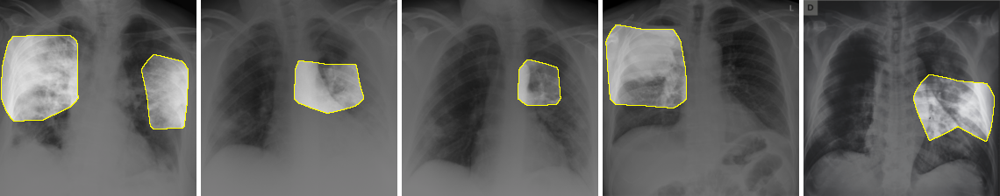


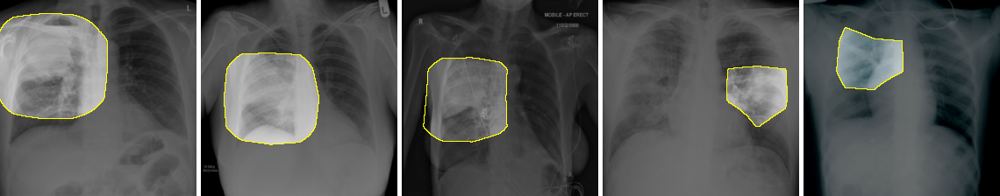


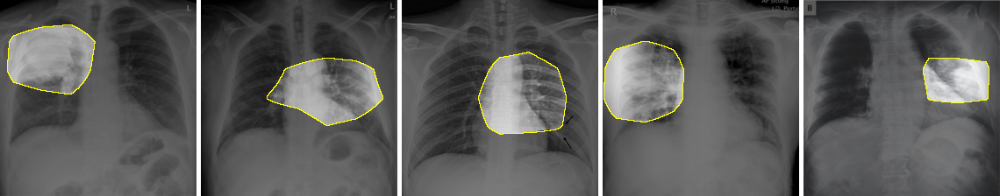


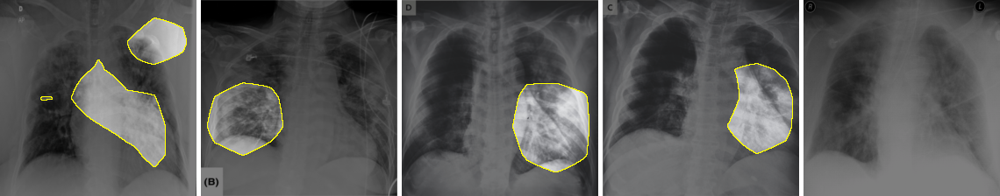


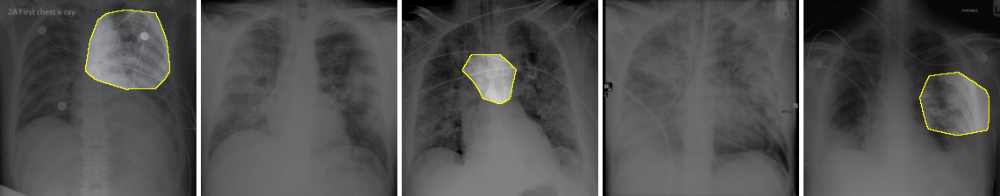


...


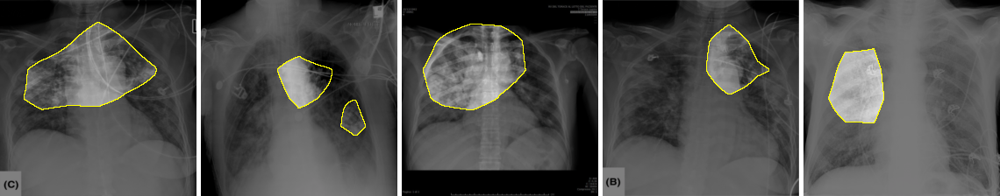


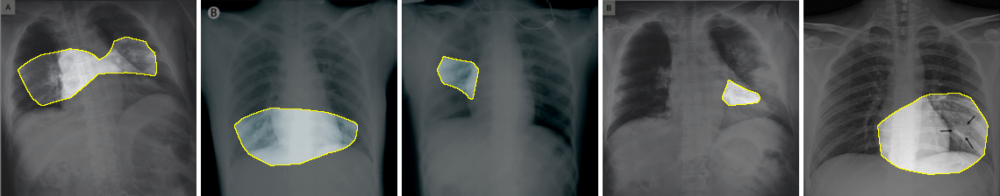


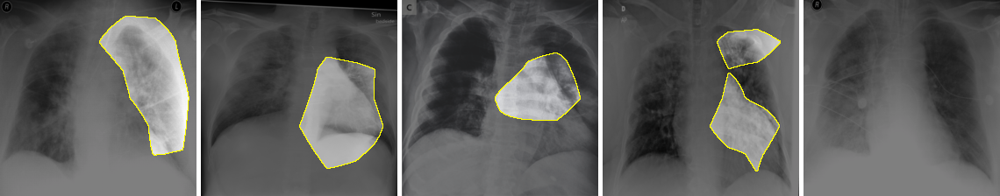


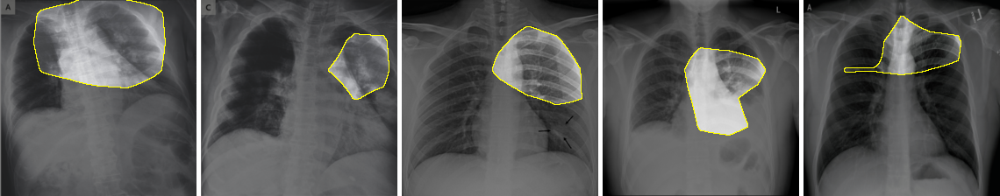


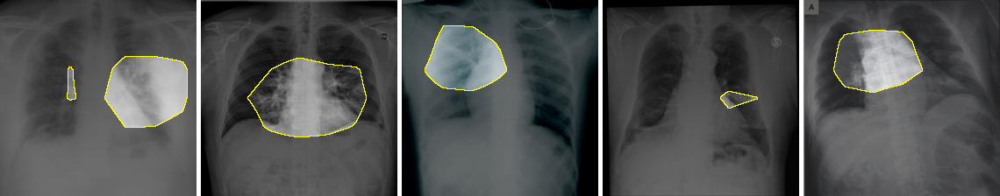

In [14]:
dissector.show_seg_results()

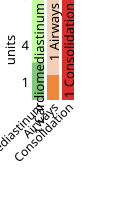

In [15]:
graph = dissector.show_unique_concepts_graph(thresh = 0.04)
import IPython
IPython.display.SVG(graph)